##### Focus Project: Cosmic Structures - Theory, Statistics and Numerics

Michelle Anderson Fontenoy
05/08/2024

This interactive notebook highlighted the code used for the focus project from the module Cosmic Structures - Theory, Statistics and Numerics at the University of Vienna, summer semester 2024.

This project is based in the implementation of simulations of initial perturbations through different physical scenarios using the cosmological $\lambda$ CDM model.

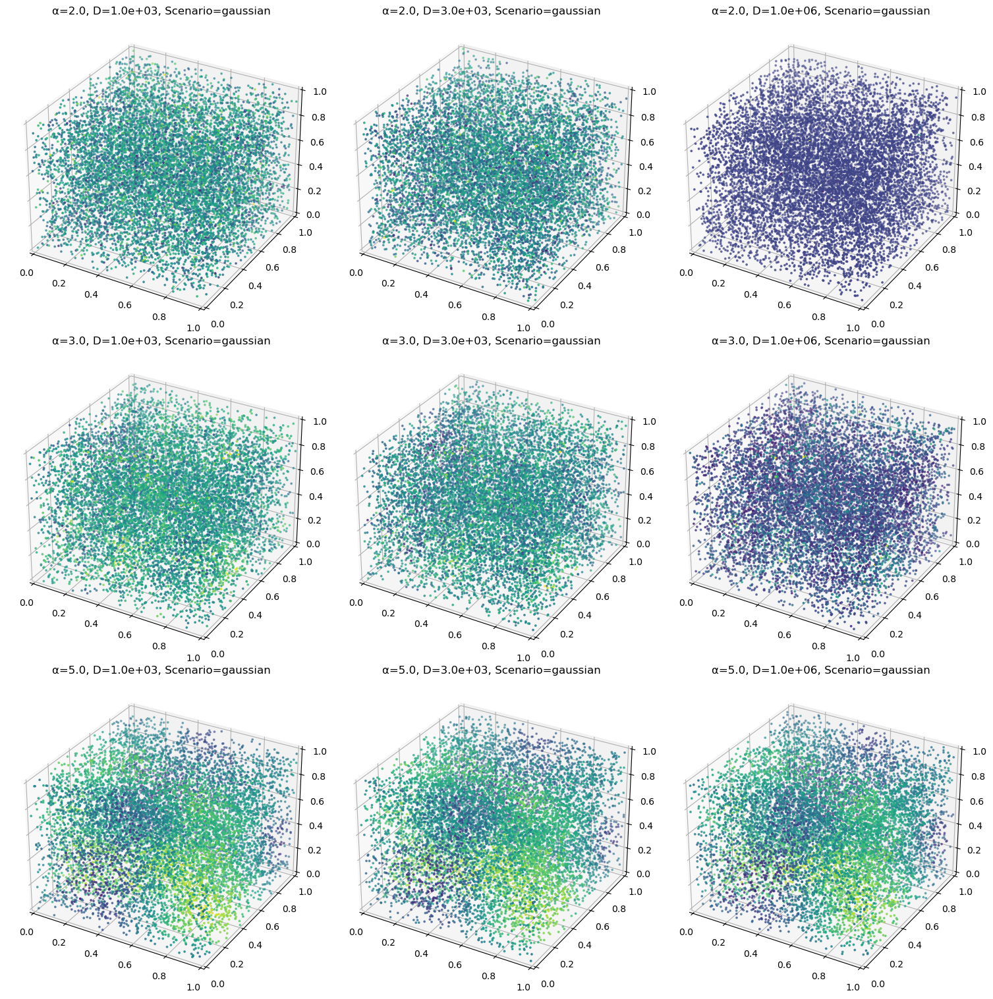

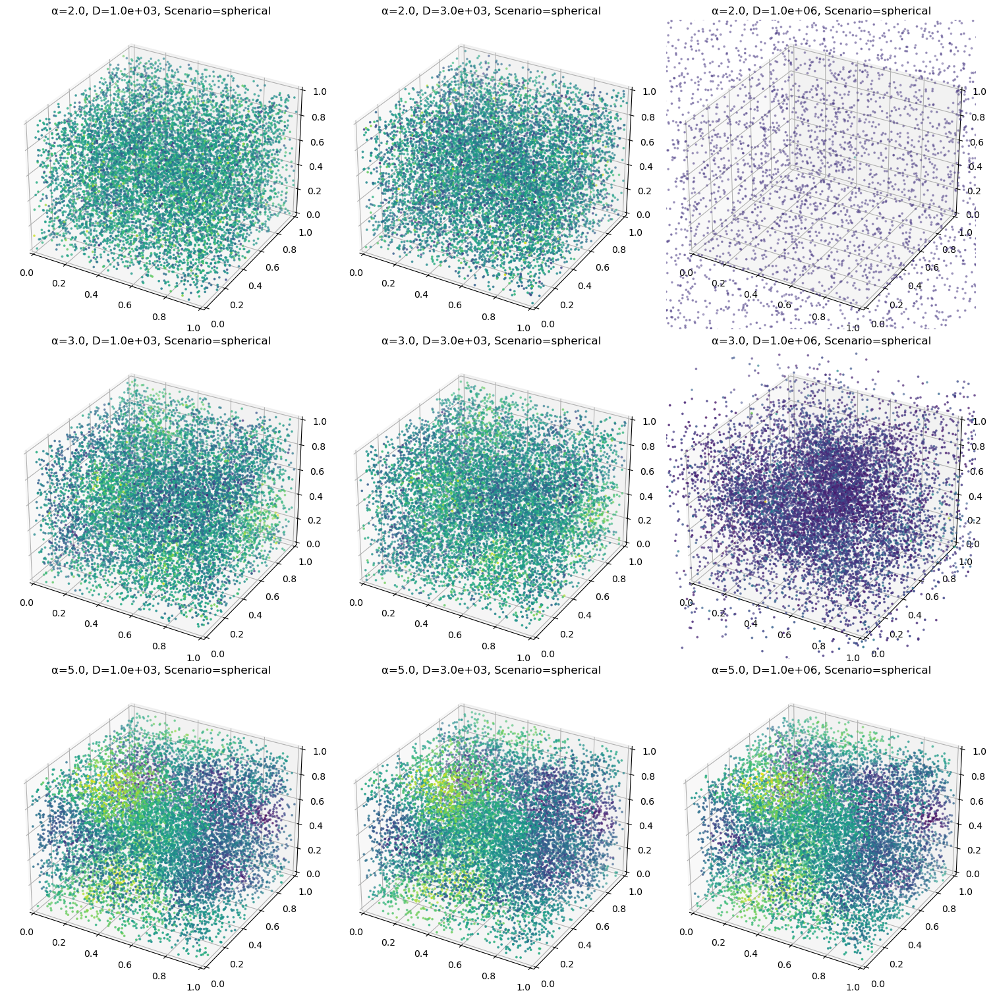

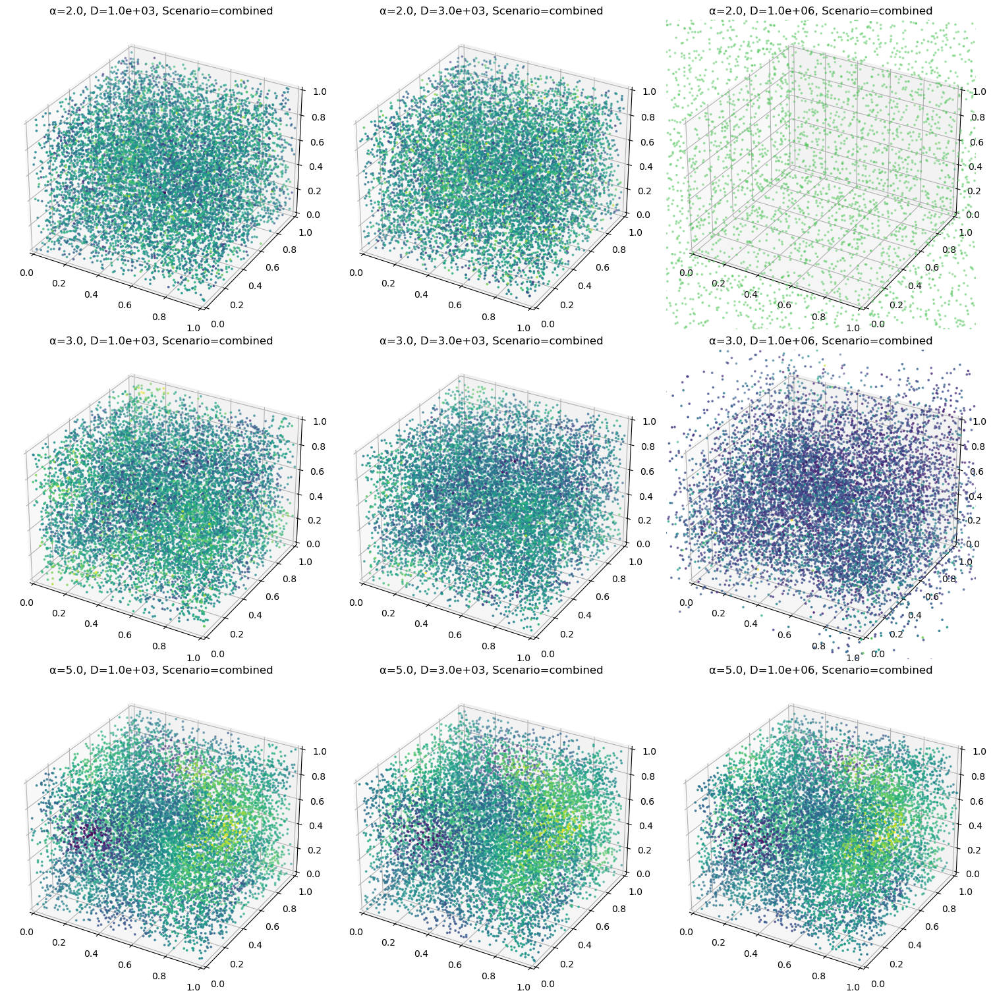

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as sf
from mpl_toolkits.mplot3d import Axes3D

# LambdaCDM growth factor
def Dplus(lambda0, a):
    return a * np.sqrt(1.0 + lambda0 * a**3) * sf.hyp2f1(3.0/2.0, 5.0/6.0, 11.0/6.0, -lambda0 * a**3)

#Defining the gaussian random field
def powerspectrum(alpha, N):
    L = 1.0
    kmin = 2.0 * np.pi / L
    k1d = np.fft.fftfreq(N, d=1.0 / kmin / N)
    kv = np.meshgrid(k1d, k1d, k1d, indexing='ij')
    fk = np.random.normal(size=(N, N, N)) + 1j * np.random.normal(size=(N, N, N))
    norm = 1.0 / (2 * np.pi) ** (3.0 / 2.0)
    kmod = np.sqrt(kv[0] ** 2 + kv[1] ** 2 + kv[2] ** 2)
    kmod[0, 0, 0] = np.inf
    fk = fk * kmod ** -(alpha / 2)
    fk[0, 0, 0] = 0.0
    f = np.fft.ifftn(fk)
    f = norm * np.real(f)
    return f, fk, kmod, kv

def gradient(alpha, N):
    f, fk, kmod, kv = powerspectrum(alpha, N)
    fD1 = np.zeros([N, N, N, 3], dtype=complex)
    for i in range(3):
        fD1[..., i] = fk * 1j * kv[i] / kmod
        fD1[0, 0, 0, i] = 0.0
    D1 = np.real(np.fft.ifftn(fD1, axes=[0, 1, 2]))
    return D1

def hessian(alpha, N):
    f, fk, kmod, kv = powerspectrum(alpha, N)
    fH1 = np.zeros([N, N, N, 3, 3], dtype=complex)
    for i in range(3):
        for j in range(3):
            fH1[..., i, j] = fk * kv[i] * kv[j] / kmod ** 2
            fH1[0, 0, 0, i, j] = 0.0
    H1 = np.real(np.fft.ifftn(fH1, axes=[0, 1, 2]))
    return H1

def signature(alpha, N):
    H = hessian(alpha, N)
    eigen = np.sort(np.linalg.eigvals(H), axis=-1)
    signature = np.sum(eigen > 0.0, axis=-1)
    return signature, eigen

def initial_spherical_perturbation(N):
    x = np.linspace(-1, 1, N)
    y = np.linspace(-1, 1, N)
    z = np.linspace(-1, 1, N)
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
    perturbation = np.sqrt(X**2 + Y**2 + Z**2)
    return perturbation

def combined_perturbation(alpha, N):
    random_field, fk, kmod, kv = powerspectrum(alpha, N)
    spherical_field = initial_spherical_perturbation(N)
    combined_field = random_field + spherical_field
    return combined_field, fk, kmod, kv

def z_map(Dplus_value, alpha, N, initial_perturbation):
    q = np.linspace(0, 1, N)
    q = np.meshgrid(q, q, q, indexing='ij')
    q = np.stack(q, axis=-1)
    g = gradient(alpha, N)
    D_growth = Dplus_value
    initial_perturbation = np.expand_dims(initial_perturbation, axis=-1)
    positions = q + D_growth * g * initial_perturbation
    return positions

def delta_d(Dplus_value, eigen):
    return 1 / ((1 + Dplus_value * eigen[..., 0]) * (1 + Dplus_value * eigen[..., 1]) * (1 + Dplus_value * eigen[..., 2])) - 1

def plot_perturbations(scenario='gaussian', D_values=[1e3, 3e3, 1e6], alpha_values=[2.0, 3.0, 5.0], N=64):
    fig = plt.figure(figsize=(15, 15), constrained_layout=True)
    for i, alpha in enumerate(alpha_values):
        sig, eigen = signature(alpha, N)
        if scenario == 'gaussian':
            initial_perturbation, _, _, _ = powerspectrum(alpha, N)
        elif scenario == 'spherical':
            initial_perturbation = initial_spherical_perturbation(N)
        elif scenario == 'combined':
            initial_perturbation, _, _, _ = combined_perturbation(alpha, N)
        for j, D_value in enumerate(D_values):
            delta = delta_d(D_value, eigen)
            positions = z_map(D_value, alpha, N, initial_perturbation)
            ax = fig.add_subplot(len(alpha_values), len(D_values), i * len(D_values) + j + 1, projection='3d')
            indices = np.random.choice(N**3, size=10000, replace=False)
            ind = np.unravel_index(indices, (N, N, N))
            ax.scatter(positions[ind][..., 0], positions[ind][..., 1], positions[ind][..., 2], c=delta[ind], cmap='viridis', s=3)
            ax.set_title(f'α={alpha}, D={D_value:.1e}, Scenario={scenario}')
            ax.set_xlim([0, 1])
            ax.set_ylim([0, 1])
            ax.set_zlim([0, 1])
    plt.show()

# Running the plot for different scenarios
plot_perturbations(scenario='gaussian', D_values=[1e3, 3e3, 1e6], alpha_values=[2.0, 3.0, 5.0], N=128)
plot_perturbations(scenario='spherical', D_values=[1e3, 3e3, 1e6], alpha_values=[2.0, 3.0, 5.0], N=128)
plot_perturbations(scenario='combined', D_values=[1e3, 3e3, 1e6], alpha_values=[2.0, 3.0, 5.0], N=128)
